In [2]:
import os
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from tensorflow import keras
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Convolution2D, MaxPooling2D, Dropout, Flatten, Dense, Conv2D
from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split
from imgaug import augmenters as iaa
import cv2
import pandas as pd
import ntpath
import random

In [3]:
datadir = r'D:\Courses\NTI_ETA\Final Project\NTI_Project\driving_log.csv'
columns = ['center', 'left', 'right', 'steering', 'throttle', 'reverse', 'speed']
data = pd.read_csv(datadir, names = columns)
pd.set_option('display.max_colwidth', None)
data.head()

,center,left,right,steering,throttle,reverse,speed
0,D:\Courses\NTI_ETA\Final Project\simulator-windows-64\IMG\center_2025_02_25_13_15_24_186.jpg,D:\Courses\NTI_ETA\Final Project\simulator-windows-64\IMG\left_2025_02_25_13_15_24_186.jpg,D:\Courses\NTI_ETA\Final Project\simulator-windows-64\IMG\right_2025_02_25_13_15_24_186.jpg,0.0,0.000000,0,4.855278
1,D:\Courses\NTI_ETA\Final Project\simulator-windows-64\IMG\center_2025_02_25_13_15_24_288.jpg,D:\Courses\NTI_ETA\Final Project\simulator-windows-64\IMG\left_2025_02_25_13_15_24_288.jpg,D:\Courses\NTI_ETA\Final Project\simulator-windows-64\IMG\right_2025_02_25_13_15_24_288.jpg,0.0,0.000000,0,4.806561
2,D:\Courses\NTI_ETA\Final Project\simulator-windows-64\IMG\center_2025_02_25_13_15_24_394.jpg,D:\Courses\NTI_ETA\Final Project\simulator-windows-64\IMG\left_2025_02_25_13_15_24_394.jpg,D:\Courses\NTI_ETA\Final Project\simulator-windows-64\IMG\right_2025_02_25_13_15_24_394.jpg,0.0,0.000000,0,4.748747
3,D:\Courses\NTI_ETA\Final Project\simulator-windows-64\IMG\center_2025_02_25_13_15_24_496.jpg,D:\Courses\NTI_ETA\Final Project\simulator-windows-64\IMG\left_2025_02_25_13_15_24_496.jpg,D:\Courses\NTI_ETA\Final Project\simulator-windows-64\IMG\right_2025_02_25_13_15_24_496.jpg,0.0,0.000000,0,4.701100
4,D:\Courses\NTI_ETA\Final Project\simulator-windows-64\IMG\center_2025_02_25_13_15_24_596.jpg,D:\Courses\NTI_ETA\Final Project\simulator-windows-64\IMG\left_2025_02_25_13_15_24_596.jpg,D:\Courses\NTI_ETA\Final Project\simulator-windows-64\IMG\right_2025_02_25_13_15_24_596.jpg,0.0,0.205937,0,4.755733


In [4]:
def path_leaf(path):
  head, tail = ntpath.split(path)
  return tail
data['center'] = data['center'].apply(path_leaf)
data['left'] = data['left'].apply(path_leaf)
data['right'] = data['right'].apply(path_leaf)
data.head()

,center,left,right,steering,throttle,reverse,speed
0,center_2025_02_25_13_15_24_186.jpg,left_2025_02_25_13_15_24_186.jpg,right_2025_02_25_13_15_24_186.jpg,0.0,0.000000,0,4.855278
1,center_2025_02_25_13_15_24_288.jpg,left_2025_02_25_13_15_24_288.jpg,right_2025_02_25_13_15_24_288.jpg,0.0,0.000000,0,4.806561
2,center_2025_02_25_13_15_24_394.jpg,left_2025_02_25_13_15_24_394.jpg,right_2025_02_25_13_15_24_394.jpg,0.0,0.000000,0,4.748747
3,center_2025_02_25_13_15_24_496.jpg,left_2025_02_25_13_15_24_496.jpg,right_2025_02_25_13_15_24_496.jpg,0.0,0.000000,0,4.701100
4,center_2025_02_25_13_15_24_596.jpg,left_2025_02_25_13_15_24_596.jpg,right_2025_02_25_13_15_24_596.jpg,0.0,0.205937,0,4.755733


[-9.06111200e-01 -8.36356376e-01 -7.66601552e-01 -6.96846728e-01
 -6.27091904e-01 -5.57337080e-01 -4.87582256e-01 -4.17827432e-01
 -3.48072608e-01 -2.78317784e-01 -2.08562960e-01 -1.38808136e-01
 -6.90533120e-02  7.01512000e-04  7.04563360e-02  1.40211160e-01
  2.09965984e-01  2.79720808e-01  3.49475632e-01  4.19230456e-01
  4.88985280e-01  5.58740104e-01  6.28494928e-01  6.98249752e-01
  7.68004576e-01  8.37759400e-01]


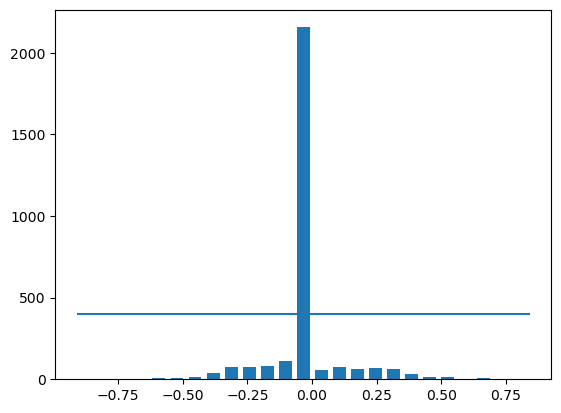

In [5]:
num_bins = 25
samples_per_bin = 400
hist, bins = np.histogram(data['steering'], num_bins)
print(bins)
center = (bins[:-1]+ bins[1:]) * 0.5
plt.bar(center, hist, width=0.05)
plt.plot((np.min(data['steering']), np.max(data['steering'])), (samples_per_bin, samples_per_bin))

In [6]:
print('total data:', len(data))
print(data.shape)

total data: 2972
(2972, 7)


In [7]:
remove_list = []
for j in range(num_bins):
  list_ = []
  for i in range(len(data['steering'])):
    if data['steering'][i] >= bins[j] and data['steering'][i] <= bins[j+1]:
      list_.append(i)
  list_ = shuffle(list_)
  list_ = list_[samples_per_bin:]
  remove_list.extend(list_)

print('removed:', len(remove_list))
data.drop(data.index[remove_list], inplace=True)
print('remaining:', len(data))

removed: 1756
remaining: 1216


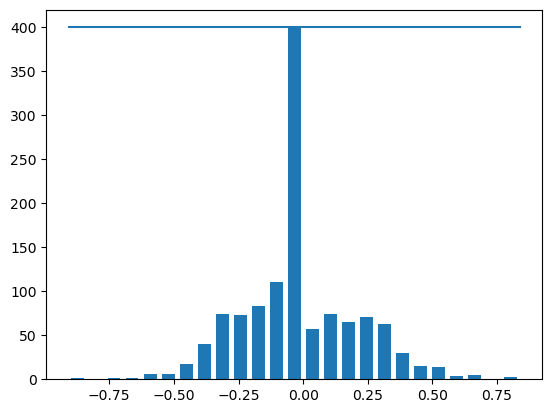

In [8]:
hist, _ = np.histogram(data['steering'], (num_bins))
plt.bar(center, hist, width=0.05)
plt.plot((np.min(data['steering']), np.max(data['steering'])), (samples_per_bin, samples_per_bin))

In [9]:
def load_img_steering(datadir, df):
  image_path = []
  steering = []
  for i in range(len(data)):
    indexed_data = data.iloc[i]
    center, left, right = indexed_data[0], indexed_data[1], indexed_data[2]
    image_path.append(os.path.join(datadir, center.strip()))
    steering.append(float(indexed_data[3]))
    # left image append
    image_path.append(os.path.join(datadir,left.strip()))
    steering.append(float(indexed_data[3])+0.15)
    # right image append
    image_path.append(os.path.join(datadir,right.strip()))
    steering.append(float(indexed_data[3])-0.15)
  image_paths = np.asarray(image_path)
  steerings = np.asarray(steering)
  return image_paths, steerings

In [10]:
datadir = r'D:\Courses\NTI_ETA\Final Project\NTI_Project'
image_paths, steerings = load_img_steering(datadir + r'\IMG', data)

X_train, X_valid, y_train, y_valid = train_test_split(image_paths, steerings, test_size=0.2, random_state=6)
print('Training Samples: {}\nValid Samples: {}'.format(len(X_train), len(X_valid)))

Training Samples: 2918
Valid Samples: 730


C:\Users\mikyg\AppData\Local\Temp\ipykernel_17324\2267315553.py:6: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  center, left, right = indexed_data[0], indexed_data[1], indexed_data[2]
C:\Users\mikyg\AppData\Local\Temp\ipykernel_17324\2267315553.py:8: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  steering.append(float(indexed_data[3]))
C:\Users\mikyg\AppData\Local\Temp\ipykernel_17324\2267315553.py:11: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `s

In [11]:
image_paths[5]

'D:\\Courses\\NTI_ETA\\Final Project\\NTI_Project\\IMG\\right_2025_02_25_13_15_24_906.jpg'

In [12]:
steerings[0]

0.0

Text(0.5, 1.0, 'Validation set')

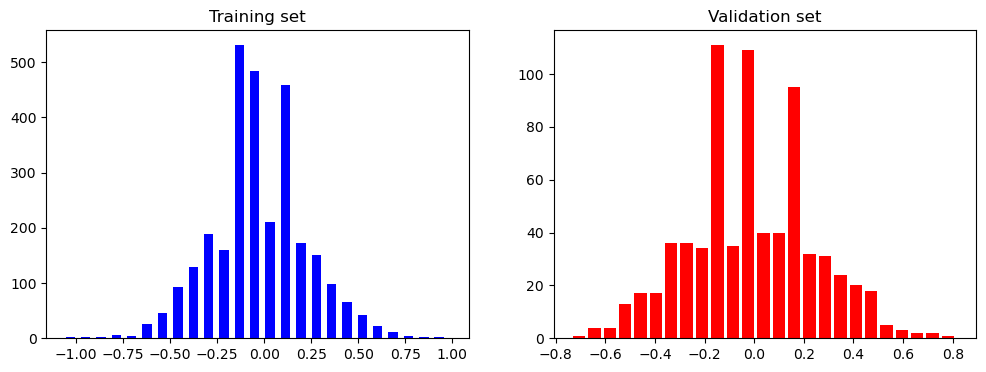

In [13]:
fig, axes = plt.subplots(1, 2, figsize=(12, 4))
axes[0].hist(y_train, bins=num_bins, width=0.05, color='blue')
axes[0].set_title('Training set')
axes[1].hist(y_valid, bins=num_bins, width=0.05, color='red')
axes[1].set_title('Validation set')

Text(0.5, 1.0, 'Zoomed Image')

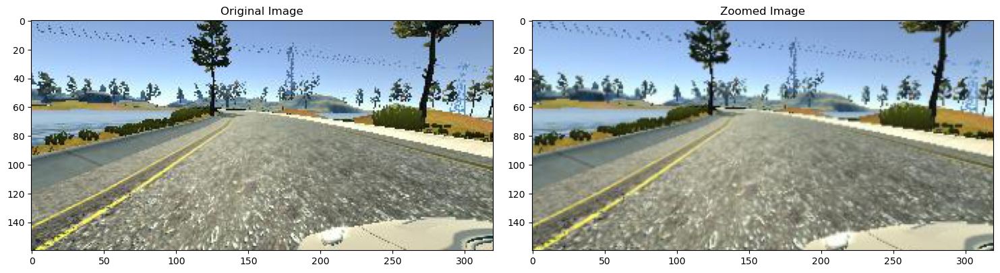

In [14]:
def zoom(image):
  zoom = iaa.Affine(scale=(1, 1.3))
  image = zoom.augment_image(image)
  return image
image = image_paths[random.randint(0, 1000)]
original_image = mpimg.imread(image)
zoomed_image = zoom(original_image)

fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()

axs[0].imshow(original_image)
axs[0].set_title('Original Image')

axs[1].imshow(zoomed_image)
axs[1].set_title('Zoomed Image')


Text(0.5, 1.0, 'Panned Image')

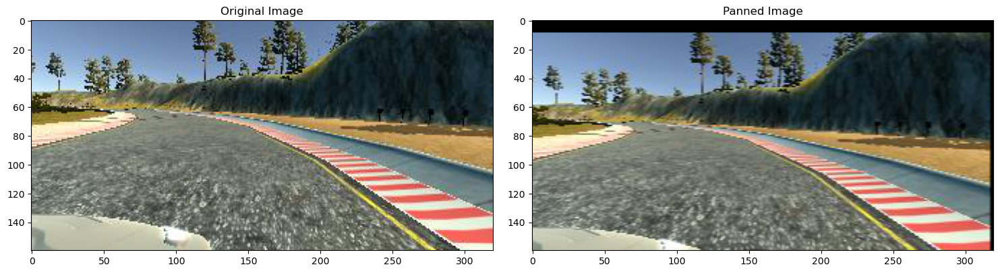

In [15]:
def pan(image):
  pan = iaa.Affine(translate_percent= {"x" : (-0.1, 0.1), "y": (-0.1, 0.1)})
  image = pan.augment_image(image)
  return image
image = image_paths[random.randint(0, 1000)]
original_image = mpimg.imread(image)
panned_image = pan(original_image)

fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()

axs[0].imshow(original_image)
axs[0].set_title('Original Image')

axs[1].imshow(panned_image)
axs[1].set_title('Panned Image')

Text(0.5, 1.0, 'Brightness altered image ')

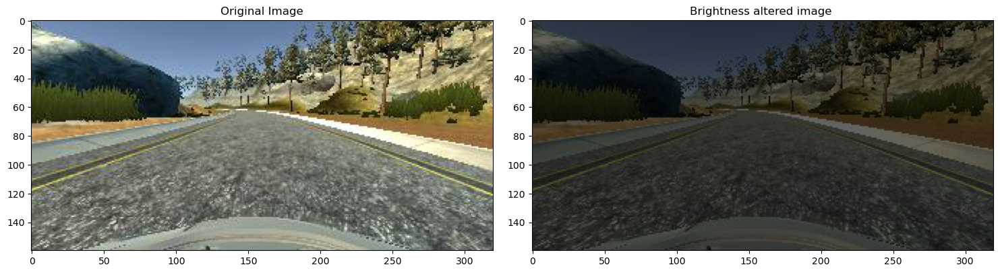

In [16]:
def img_random_brightness(image):
    brightness = iaa.Multiply((0.2, 1.2))
    image = brightness.augment_image(image)
    return image
image = image_paths[random.randint(0, 1000)]
original_image = mpimg.imread(image)
brightness_altered_image = img_random_brightness(original_image)

fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()

axs[0].imshow(original_image)
axs[0].set_title('Original Image')

axs[1].imshow(brightness_altered_image)
axs[1].set_title('Brightness altered image ')

Text(0.5, 1.0, 'Flipped Image - Steering Angle:0.31449800000000006')

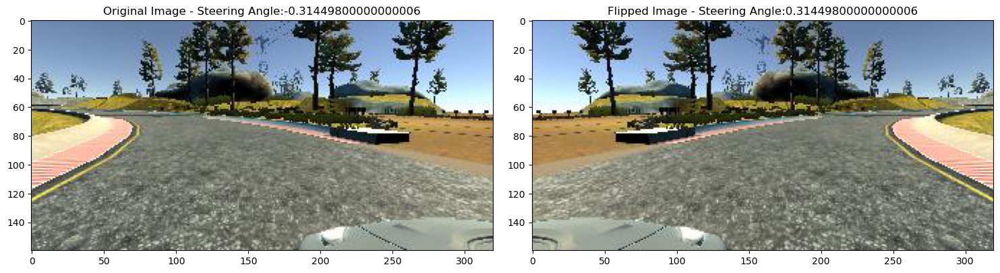

In [17]:
def img_random_flip(image, steering_angle):
    image = cv2.flip(image,1)
    steering_angle = -steering_angle
    return image, steering_angle
random_index = random.randint(0, 1000)
image = image_paths[random_index]
steering_angle = steerings[random_index]


original_image = mpimg.imread(image)
flipped_image, flipped_steering_angle = img_random_flip(original_image, steering_angle)

fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()

axs[0].imshow(original_image)
axs[0].set_title('Original Image - ' + 'Steering Angle:' + str(steering_angle))

axs[1].imshow(flipped_image)
axs[1].set_title('Flipped Image - ' + 'Steering Angle:' + str(flipped_steering_angle))

Text(0.5, 1.0, 'Cutout image ')

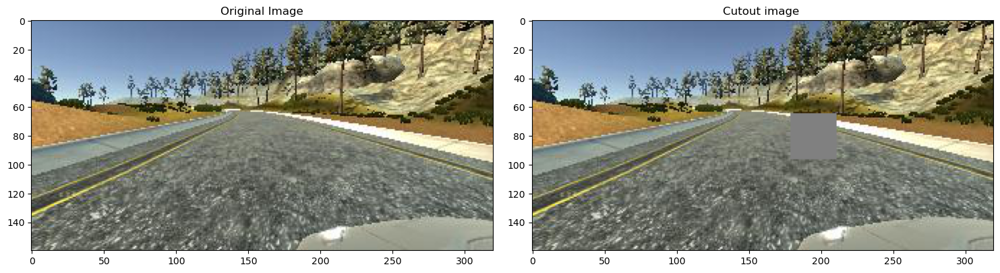

In [14]:
def img_random_cutout(image):
    cutout = iaa.Cutout(nb_iterations=1, size=0.2, squared=True)
    image = cutout.augment_image(image)
    return image
image = image_paths[random.randint(0, 1000)]
original_image = mpimg.imread(image)
brightness_altered_image = img_random_cutout(original_image)

fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()

axs[0].imshow(original_image)
axs[0].set_title('Original Image')

axs[1].imshow(brightness_altered_image)
axs[1].set_title('Cutout image ')

In [19]:
def random_augment(image, steering_angle):
    image = mpimg.imread(image)
    if np.random.rand() < 0.5:
      image = pan(image)
    if np.random.rand() < 0.5:
      image = zoom(image)
    if np.random.rand() < 0.5:
      image = img_random_brightness(image)
    if np.random.rand() < 0.5:
      image = img_random_cutout(image)  
    if np.random.rand() < 0.5:
      image, steering_angle = img_random_flip(image, steering_angle)

    return image, steering_angle

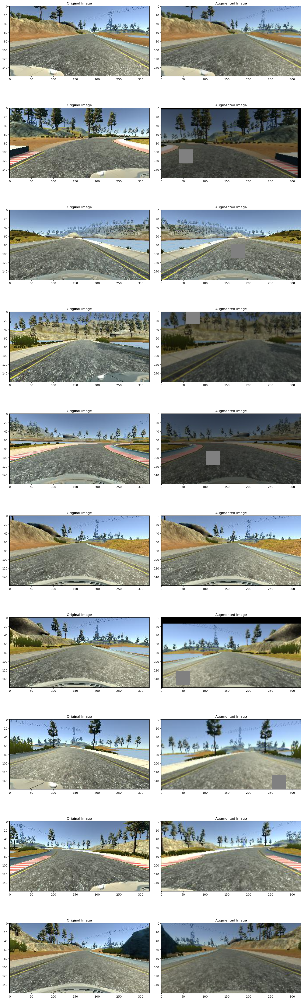

In [20]:
ncol = 2
nrow = 10

fig, axs = plt.subplots(nrow, ncol, figsize=(15, 50))
fig.tight_layout()

for i in range(10):
  randnum = random.randint(0, len(image_paths) - 1)
  random_image = image_paths[randnum]
  random_steering = steerings[randnum]

  original_image = mpimg.imread(random_image)
  augmented_image, steering = random_augment(random_image, random_steering)

  axs[i][0].imshow(original_image)
  axs[i][0].set_title("Original Image")

  axs[i][1].imshow(augmented_image)
  axs[i][1].set_title("Augmented Image")

In [21]:
def img_preprocess(img):
    img = img[60:135,:,:]
    img = cv2.cvtColor(img, cv2.COLOR_RGB2YUV)
    img = cv2.GaussianBlur(img,  (3, 3), 0)
    img = cv2.resize(img, (200, 66))
    img = img/255
    return img

Text(0.5, 1.0, 'Preprocessed Image')

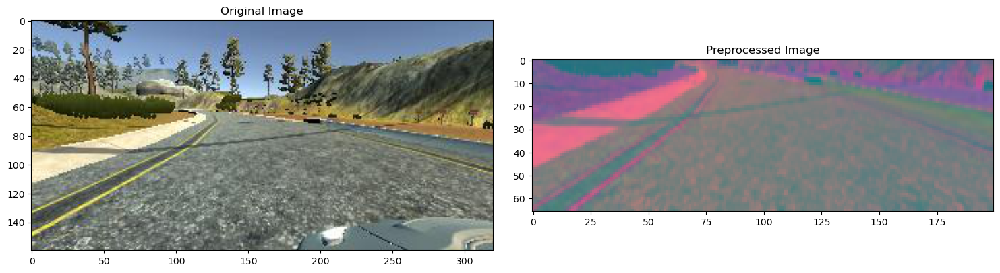

In [22]:
image = image_paths[100]
original_image = mpimg.imread(image)
preprocessed_image = img_preprocess(original_image)

fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()
axs[0].imshow(original_image)
axs[0].set_title('Original Image')
axs[1].imshow(preprocessed_image)
axs[1].set_title('Preprocessed Image')

In [23]:
def batch_generator(image_paths, steering_ang, batch_size, istraining):

  while True:
    batch_img = []
    batch_steering = []

    for i in range(batch_size):
      random_index = random.randint(0, len(image_paths) - 1)

      if istraining:
        im, steering = random_augment(image_paths[random_index], steering_ang[random_index])

      else:
        im = mpimg.imread(image_paths[random_index])
        steering = steering_ang[random_index]

      im = img_preprocess(im)
      batch_img.append(im)
      batch_steering.append(steering)
    yield (np.asarray(batch_img), np.asarray(batch_steering))
x_train_gen, y_train_gen = next(batch_generator(X_train, y_train, 1, 1))
x_valid_gen, y_valid_gen = next(batch_generator(X_valid, y_valid, 1, 0))

Text(0.5, 1.0, 'Validation Image')

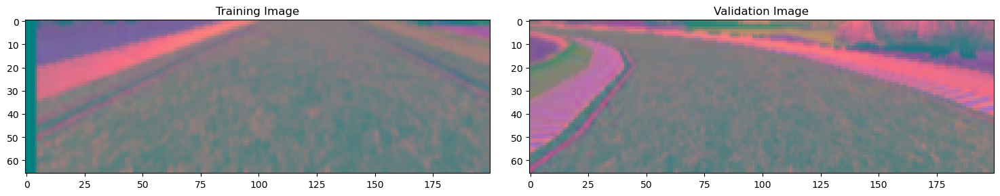

In [24]:
fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()

axs[0].imshow(x_train_gen[0])
axs[0].set_title('Training Image')

axs[1].imshow(x_valid_gen[0])
axs[1].set_title('Validation Image')

In [27]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, Flatten, Dense, Input
import tensorflow as tf

def car_model():
    model = Sequential()
    model.add(Input(shape=(66, 200, 3)))  # Add Input layer with the specified shape
    model.add(Conv2D(24, (5, 5), strides=(2, 2), activation='elu'))
    model.add(Conv2D(36, (5, 5), strides=(2, 2), activation='elu'))
    model.add(Conv2D(48, (5, 5), strides=(2, 2), activation='elu'))
    model.add(Conv2D(64, (5, 5), activation='elu'))
    model.add(Flatten())
    model.add(Dense(100, activation='elu'))
    model.add(Dense(50, activation='elu'))
    model.add(Dense(10, activation='elu'))
    model.add(Dense(1))

    optimizer = tf.keras.optimizers.Adam(learning_rate=1e-3)
    model.compile(loss='mse', optimizer=optimizer)
    
    return model
model = car_model()
print(model.summary())

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_4 (Conv2D)               │ (None, 31, 98, 24)     │         1,824 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 14, 47, 36)     │        21,636 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_6 (Conv2D)               │ (None, 5, 22, 48)      │        43,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_7 (Conv2D)               │ (None, 1, 18, 64)      │        76,864 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_1 (Flatten)             │ (None, 1152)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 100)            │       115,300 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 50)             │         5,050 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6 (Dense)                 │ (None, 10)             │           510 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_7 (Dense)                 │ (None, 1)              │            11 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 264,443 (1.01 MB)

 Trainable params: 264,443 (1.01 MB)

 Non-trainable params: 0 (0.00 B)

None


In [29]:
history = model.fit(batch_generator(X_train, y_train, 100, 1),
                    steps_per_epoch=300,
                    epochs=10,
                    validation_data=batch_generator(X_valid, y_valid, 100, 0),
                    validation_steps=200,
                    verbose=1,
                    shuffle=True)

Epoch 1/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 158s 519ms/step - loss: 0.2071 - val_loss: 0.0313
Epoch 2/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 134s 449ms/step - loss: 0.0462 - val_loss: 0.0263
Epoch 3/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 134s 447ms/step - loss: 0.0394 - val_loss: 0.0264
Epoch 4/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 133s 446ms/step - loss: 0.0383 - val_loss: 0.0239
Epoch 5/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 136s 454ms/step - loss: 0.0352 - val_loss: 0.0243
Epoch 6/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 132s 441ms/step - loss: 0.0339 - val_loss: 0.0254
Epoch 7/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 123s 410ms/step - loss: 0.0325 - val_loss: 0.0268
Epoch 8/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 123s 411ms/step - loss: 0.0323 - val_loss: 0.0250
Epoch 9/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 123s 412ms/step - loss: 0.0309 - val_loss: 0.0228
Epoch 10/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 123s 410ms/step - loss: 0.0297 - val_loss: 0.0240


Text(0.5, 0, 'Epoch')

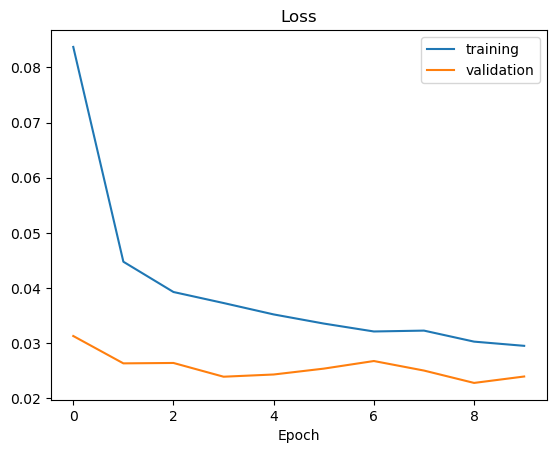

In [30]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.legend(['training', 'validation'])
plt.title('Loss')
plt.xlabel('Epoch')


In [33]:
model.save(r'D:\Courses\NTI_ETA\Final Project\NTI_Project\model.h5')
print('Model Saved')


Model Saved


In [34]:
model.save(r'D:\Courses\NTI_ETA\Final Project\NTI_Project\model.keras')
print('Model Saved')


Model Saved
